In [1]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import pretty_midi
import numpy as np
import json

In [2]:
MUSIC_TRAIN_PATH = 'music/train/maestro-v3.0.0'
MUSIC_TEST_PATH = 'music/test/maestro-v3.0.0'
MUSIC_SAMPLE_PATH = 'music/sample'
JSON_PATH = 'music'
KEY_FPS = 16
HOP_LENGTH = 1024
WINDOW_SIZE_IN_KEYS = 64
SAMPLE_RATE = KEY_FPS * HOP_LENGTH
FRAME_SIZE = WINDOW_SIZE_IN_KEYS * HOP_LENGTH
MAX_PIANO_FREQ = 8192

In [31]:
def load_songs(dataset_path):
    songs = []
    sr = None
    for path, _, files in os.walk(dataset_path):
        for file in files:
            file_base_name, file_ext = os.path.splitext(file)
            if file_ext in ['.wav', '.mp3']:
                song, sr = librosa.load(os.path.join(path, file), sr=SAMPLE_RATE)
                songs.append(song)
    return songs, sr

In [32]:
ipd.Audio('music/sample/drive_forever.mp3')

In [33]:
songs, _ = load_songs(MUSIC_SAMPLE_PATH)
print("Loaded %d songs" % (len(songs),))

C:\Users\amogh\anaconda3\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Loaded 2 songs


## Audio waveform

Text(228.25, 0.5, 'Amplitude')

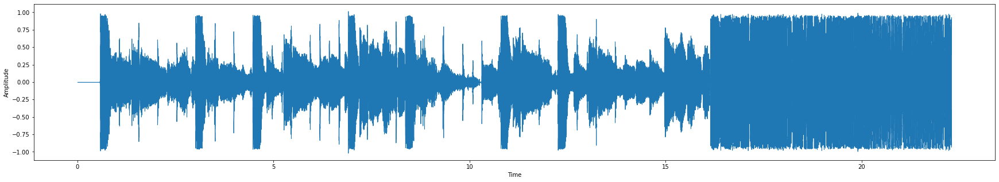

In [34]:
song = songs[0]
fig = plt.figure(figsize=(30, 5))
plt.subplot(1, 1, 1)
librosa.display.waveshow(song[:SAMPLE_RATE*30])
plt.xlabel('Time')
plt.ylabel('Amplitude')

## Discrete Fourier Transform of audio signal using FFT

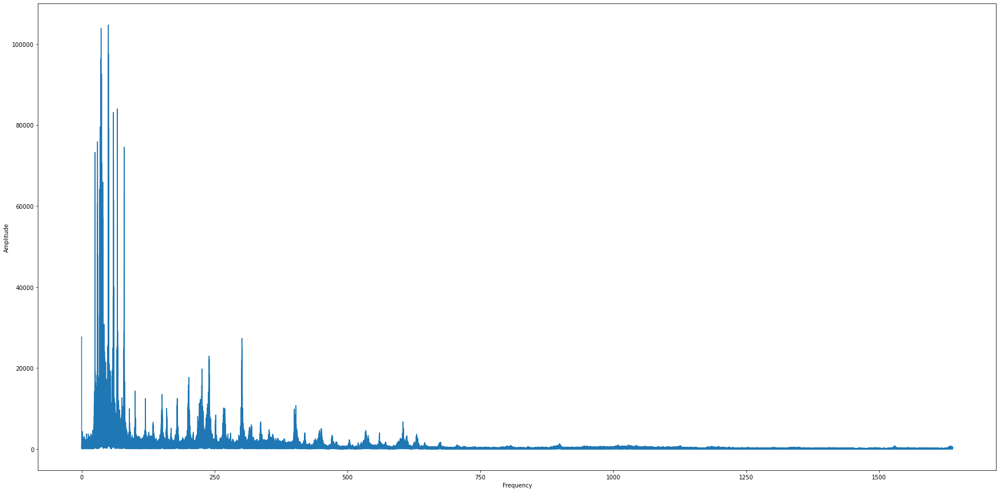

In [35]:
fft = np.abs(np.fft.fft(song))
fft = fft[:len(fft)//10]
freq = np.linspace(0, SAMPLE_RATE/10, len(fft))
plt.figure(figsize=(30, 15))
plt.subplot(1, 1, 1)
plt.plot(freq, fft)
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.show()

## Log Amplitude spectogram of Short-Time Fourier Transform

In [36]:
stft = librosa.core.stft(song, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)
spectogram = np.abs(stft)
log_spectogram = librosa.amplitude_to_db(spectogram)
print(log_spectogram.shape)

(32769, 4387)


In [37]:
"""
fig = plt.figure(figsize=(30, 10))
plt.subplot(1, 1, 1)
librosa.display.specshow(log_spectogram, sr=SAMPLE_RATE, hop_length=HOP_LENGTH)
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar()
plt.show()
"""

"\nfig = plt.figure(figsize=(30, 10))\nplt.subplot(1, 1, 1)\nlibrosa.display.specshow(log_spectogram, sr=SAMPLE_RATE, hop_length=HOP_LENGTH)\nplt.xlabel('Time')\nplt.ylabel('Frequency')\nplt.colorbar()\nplt.show()\n"

## Note Tokenizer

In [66]:
class TokenizNotes:
    def __init__(self):
        self.tokens_to_notes = {}
        self.notes_to_tokens = {}
        self.unique_notes = 0
    
    def get_tokenized_note(self, one_hot_note):
        list_notes = np.where(one_hot_note == 1)[0]
        note_str = ','.join([str(x) for x in list_notes])
        
        if note_str not in self.notes_to_tokens:
            self.notes_to_tokens[note_str] = self.unique_notes
            self.tokens_to_notes[self.unique_notes] = note_str
            self.unique_notes += 1

        return self.notes_to_tokens[note_str]
    
    def get_tokenized_notes(self, one_hot_notes):
        return np.array([self.get_tokenized_note(one_hot_notes[t_step,:]) for t_step in range(one_hot_notes.shape[0])])

## Preprocess Data

In [67]:
def process_pretty_midi(midi_data_path, key_fps=KEY_FPS):
    midi_pretty = pretty_midi.PrettyMIDI(midi_data_path)
    piano_midi = midi_pretty.instruments[0]
    piano_roll = piano_midi.get_piano_roll(fs=key_fps)
    return piano_roll

In [71]:
def get_json_data(data_path, n_fft, hop_length):
    data = {
        'filenames':[],
        'input':[],
        'output':[],
        'notes_to_tokens_dict' : {},
        'tokens_to_notes_dict' : {} 
    }
    inp_dict = {}
    out_dict = {}
    tokenizer = TokenizNotes()
    for i, (dirpath, dirnames, filenames) in enumerate(os.walk(data_path)):
        if dirpath is not data_path:
            for file in filenames:
                print(file)
                file_base_name, file_ext = os.path.splitext(file)       
                file_path = os.path.join(dirpath, file)
                if file_base_name not in data['filenames']:
                    data['filenames'].append(file_base_name)
                
                if file_ext == '.wav':
                    signal, sr = librosa.load(file_path, sr=SAMPLE_RATE)
                    stft_signal = librosa.core.stft(signal, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)
                    inp_dict[file_base_name] = librosa.amplitude_to_db(np.abs(stft_signal))[:MAX_PIANO_FREQ,:]
                elif file_ext == '.midi':
                    out_dict[file_base_name] = process_pretty_midi(file_path)
                else:
                    pass
    
    for base_file in data['filenames']:
        diff = inp_dict[base_file].shape[1]-out_dict[base_file].shape[1]
        if diff > 0:
            out_dict[base_file] = np.column_stack((out_dict[base_file], np.zeros((out_dict[base_file].shape[0], diff))))
        elif diff < 0:
            inp_dict[base_file] = np.column_stack((inp_dict[base_file], np.zeros((inp_dict[base_file].shape[0], -diff))))
        else:
            pass
        
        one_hot_notes = np.where(out_dict[base_file] > 0, 1, 0).T
        tokenized_notes = tokenizer.get_tokenized_notes(one_hot_notes)

        data['input'].append(inp_dict[base_file].T)
        data['output'].append(tokenized_notes.T)
    
    data['notes_to_tokens_dict'] = tokenizer.notes_to_tokens
    data['tokens_to_notes_dict'] = tokenizer.tokens_to_notes
    data['num_unique_notes'] = tokenizer.unique_notes
    data['key_fps'] = KEY_FPS
    data['hop_length'] = HOP_LENGTH
    data['windows_size_in_keys'] = WINDOW_SIZE_IN_KEYS
    data['max_piano_freq'] = MAX_PIANO_FREQ
    
    del inp_dict
    del out_dict

    return data

In [72]:
# json_data = get_json_data(MUSIC_TRAIN_PATH, FRAME_SIZE, HOP_LENGTH)
json_data = get_json_data(MUSIC_SAMPLE_PATH, FRAME_SIZE, HOP_LENGTH)

MIDI-Unprocessed_SMF_02_R1_2004_01-05_ORIG_MID--AUDIO_02_R1_2004_05_Track05_wav.midi
MIDI-Unprocessed_SMF_02_R1_2004_01-05_ORIG_MID--AUDIO_02_R1_2004_05_Track05_wav.wav


In [ ]:
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

json_dump = json.dumps(json_data, cls=NumpyEncoder)
with open(os.path.join(MUSIC_SAMPLE_PATH, 'processed_data.json'), 'w') as json_file:
    json.dump(json_dump, json_file)